# Life Expectancy Insights Challenge 2

**Overview**
Welcome to the Life Expectancy Insights competition! Your task is to predict the life expectancy of individuals based on various health, demographic, and socio-economic factors. This challenge provides an opportunity to explore real-world datasets and apply your data science and machine learning skills to uncover patterns that influence life expectancy.

**Goal**
The goal of this competition is to build a model capable of accurately predicting life expectancy given a set of features. Participants will be evaluated based on the accuracy of their predictions, encouraging innovative solutions and creative feature engineering.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from xgboost import XGBRegressor
import warnings
warnings.filterwarnings('ignore')

In [2]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")


In [3]:
train.columns

Index(['Id', 'Country', 'Year', 'Status', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling',
       'Life expectancy '],
      dtype='object')

**Elimino los espacios al principio y final en las columnas (train y test)**

In [4]:
train.columns = [col.strip() for col in train.columns]
test.columns = [col.strip() for col in test.columns]

**Corrijo el nombre de la columna 'thinness  1-19 years'**

In [5]:
train = train.rename(columns={'thinness  1-19 years': 'thinness 10-19 years'})
test = test.rename(columns={'thinness  1-19 years': 'thinness 10-19 years'})

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2350 entries, 0 to 2349
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Id                               2350 non-null   int64  
 1   Country                          2350 non-null   object 
 2   Year                             2350 non-null   int64  
 3   Status                           2350 non-null   object 
 4   Adult Mortality                  2350 non-null   float64
 5   infant deaths                    2350 non-null   int64  
 6   Alcohol                          2350 non-null   float64
 7   percentage expenditure           2350 non-null   float64
 8   Hepatitis B                      2350 non-null   float64
 9   Measles                          2350 non-null   int64  
 10  BMI                              2350 non-null   float64
 11  under-five deaths                2350 non-null   int64  
 12  Polio               

In [7]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 588 entries, 0 to 587
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Id                               588 non-null    int64  
 1   Country                          588 non-null    object 
 2   Year                             588 non-null    int64  
 3   Status                           588 non-null    object 
 4   Adult Mortality                  588 non-null    float64
 5   infant deaths                    588 non-null    int64  
 6   Alcohol                          588 non-null    float64
 7   percentage expenditure           588 non-null    float64
 8   Hepatitis B                      588 non-null    float64
 9   Measles                          588 non-null    int64  
 10  BMI                              588 non-null    float64
 11  under-five deaths                588 non-null    int64  
 12  Polio                 

In [8]:
submission = test[["Id"]].copy()

test["Life expectancy"] = np.nan

df = pd.concat([train, test], ignore_index=True)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Id                               2938 non-null   int64  
 1   Country                          2938 non-null   object 
 2   Year                             2938 non-null   int64  
 3   Status                           2938 non-null   object 
 4   Adult Mortality                  2938 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2938 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [10]:
df.describe()

,Id,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling,Life expectancy
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,...,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000,2350.000000
mean,1468.500000,2007.518720,164.725664,30.303948,4.546875,738.251295,83.022124,2419.592240,38.381178,42.035739,...,5.924098,82.393125,1.742103,6611.523863,1.023085e+07,4.821886,4.852144,0.630362,12.009837,69.286766
std,848.271871,4.613841,124.086215,117.926501,3.921946,1987.914858,22.996984,11467.272489,19.935375,160.445548,...,2.400770,23.655562,5.077785,13296.603449,5.402242e+07,4.397621,4.485854,0.205140,3.265139,9.557714
min,0.000000,2000.000000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000,36.300000
25%,734.250000,2004.000000,74.000000,0.000000,1.092500,4.685343,82.000000,0.000000,19.400000,0.000000,...,4.370000,78.000000,0.100000,580.486996,4.189172e+05,1.600000,1.600000,0.504250,10.300000,63.300000
50%,1468.500000,2008.000000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,...,5.755000,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000,72.200000
75%,2202.750000,2012.000000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,...,7.330000,97.000000,0.800000,4779.405190,4.584371e+06,7.100000,7.200000,0.772000,14.100000,75.700000
max,2937.000000,2015.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,...,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000,89.000000


In [11]:
df.head()

,Id,Country,Year,Status,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling,Life expectancy
0,456,Cabo Verde,2007,Developing,126.0,0,5.28,345.463714,96.0,0,...,4.30,98.0,0.6,3112.285712,486438.0,8.1,8.0,0.602,11.9,72.3
1,462,Cabo Verde,2001,Developing,152.0,0,3.81,150.743486,92.0,0,...,5.19,9.0,0.8,1268.884564,443716.0,9.4,9.3,0.562,11.0,73.0
2,2172,Saint Lucia,2011,Developing,143.0,0,10.43,0.000000,99.0,0,...,7.58,99.0,0.1,1766.947595,1386542.0,4.3,4.3,0.733,12.9,74.6
3,2667,Tunisia,2013,Developing,13.0,3,1.29,594.645310,98.0,16,...,7.26,98.0,0.1,4199.472530,1114558.0,6.4,6.3,0.720,14.7,74.9
4,381,Brunei Darussalam,2002,Developing,95.0,0,0.13,941.703687,99.0,0,...,3.40,94.0,0.1,16846.219800,1386542.0,6.7,6.1,0.820,13.3,74.8


**Separo numéricas de categóricas**

In [12]:
num_cols = df.select_dtypes(include=np.number).columns
cat_cols = df.select_dtypes(include="object").columns

In [13]:
num_cols

Index(['Id', 'Year', 'Adult Mortality', 'infant deaths', 'Alcohol',
       'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness 10-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling',
       'Life expectancy'],
      dtype='object')

In [14]:
cat_cols

Index(['Country', 'Status'], dtype='object')

## **Univariate Analysis**

**Numerical Variables**

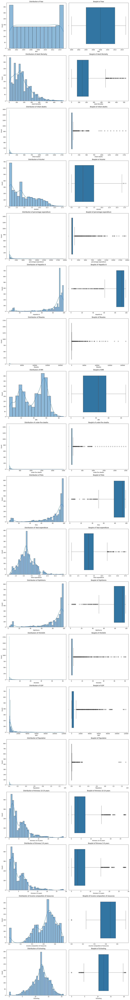

In [15]:
# Histograms and boxplots for numerical variables
num_cols = df.select_dtypes(include=np.number).columns.tolist()

if 'Id' in num_cols:
    num_cols.remove('Id')
# Safely remove 'Life expectancy' as it might not be in num_cols after concat if test had no 'Life expectancy'
if 'Life expectancy' in num_cols:
    num_cols.remove('Life expectancy')


# Calculate the number of rows needed for the subplots (one row per variable for histogram and boxplot)
n_rows = len(num_cols)
n_cols_per_row = 2 # One column for histogram, one for boxplot

# Adjust figure size based on the number of variables
plt.figure(figsize=(15, n_rows * 6)) # Increased height to accommodate two plots per variable

for i, var in enumerate(num_cols):
    # Histogram in the first column of the current row
    plt.subplot(n_rows, n_cols_per_row, i * n_cols_per_row + 1)
    sns.histplot(data=df, x=var, kde=True)
    plt.title(f'Distribution of {var}')

    # Boxplot in the second column of the current row
    plt.subplot(n_rows, n_cols_per_row, i * n_cols_per_row + 2)
    sns.boxplot(data=df, x=var)
    plt.title(f'Boxplot of {var}')

plt.tight_layout()
plt.show()

**Outliers**

In [16]:
def count_outliers_iqr(df):
    outlier_counts = {}
    for col in df.select_dtypes(include=np.number).columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]
        outlier_counts[col] = len(outliers)
    return pd.Series(outlier_counts).sort_values(ascending=False)

outliers_iqr = count_outliers_iqr(df)
print(outliers_iqr)

Measles                            542
HIV/AIDS                           542
Population                         452
GDP                                445
under-five deaths                  394
percentage expenditure             389
Hepatitis B                        322
infant deaths                      315
Diphtheria                         298
Polio                              279
Income composition of resources    130
thinness 10-19 years               100
thinness 5-9 years                  99
Adult Mortality                     86
Schooling                           77
Total expenditure                   51
Life expectancy                     14
Alcohol                              3
Id                                   0
Year                                 0
BMI                                  0
dtype: int64


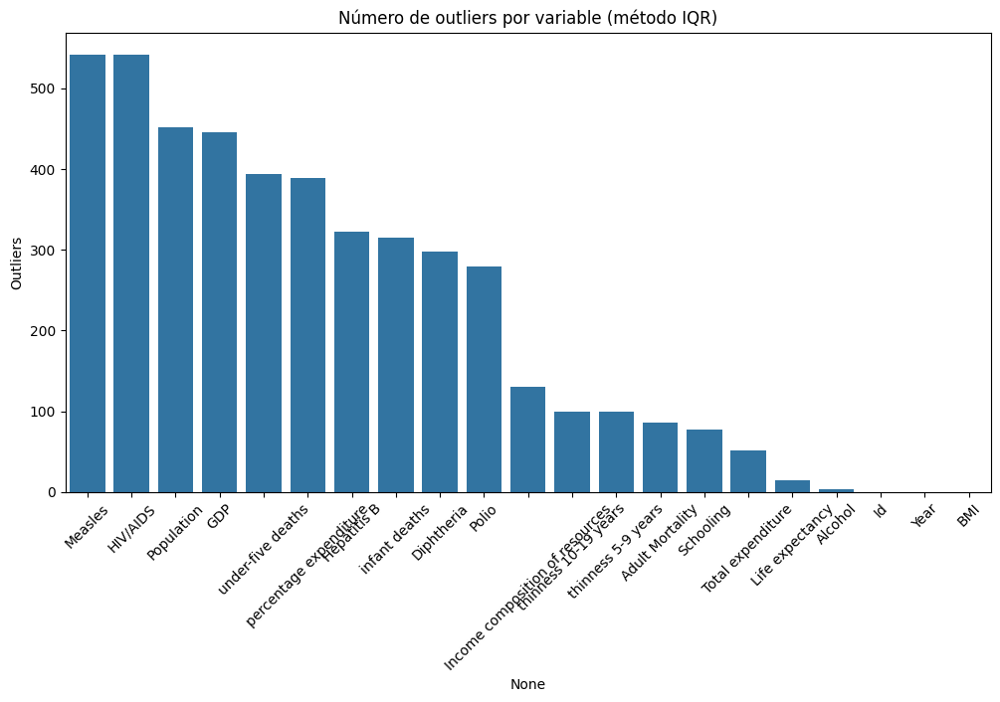

In [24]:
plt.figure(figsize=(12, 6))
sns.barplot(x=outliers_iqr.index, y=outliers_iqr.values)
plt.xticks(rotation=45)
plt.title("Número de outliers por variable (método IQR)")
plt.ylabel("Outliers")
plt.show()

**Categorical Variables**

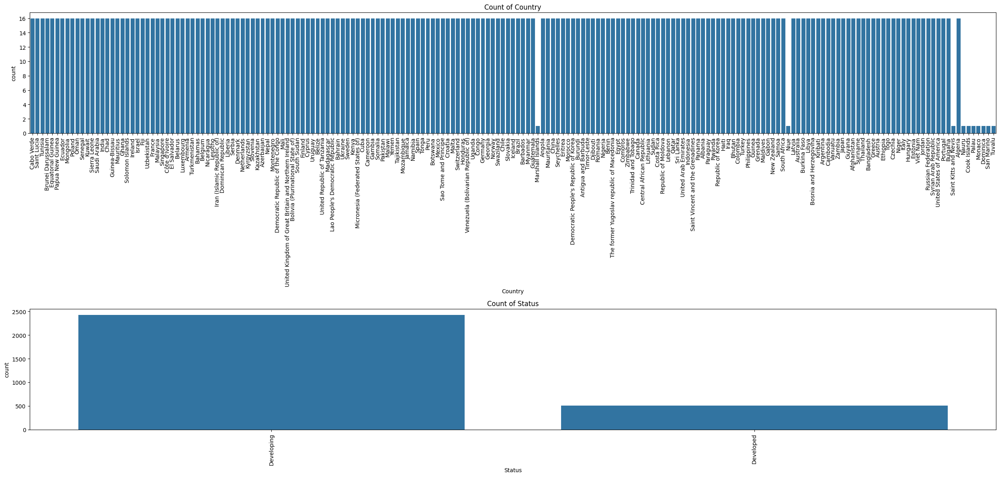

In [17]:
cat_vars = df.select_dtypes(include='object').columns.tolist()

n_rows = len(cat_vars)
n_cols = 1

plt.figure(figsize=(25, n_rows * 6))

for i, var in enumerate(cat_vars):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.countplot(data=df, x=var)
    plt.title(f'Count of {var}')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

## Bivariate *Analysis*

**Numerical vs. Numerical**

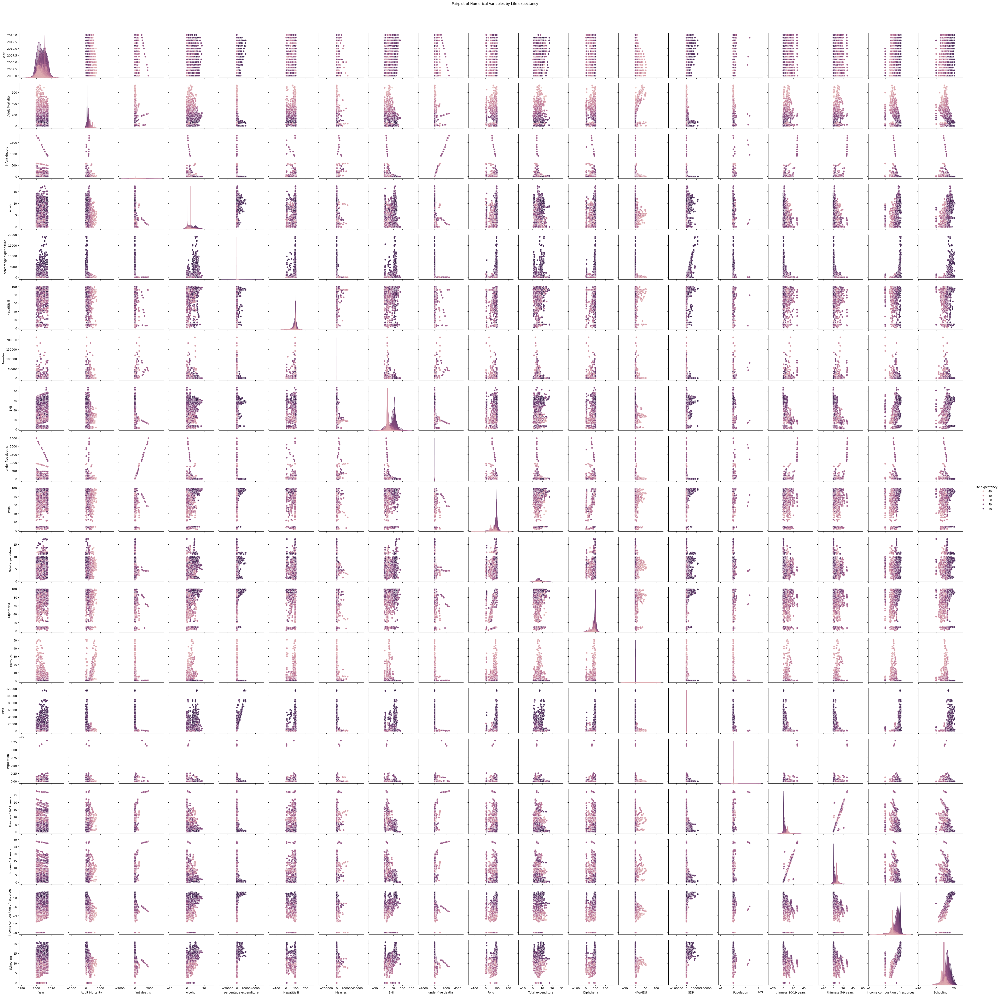

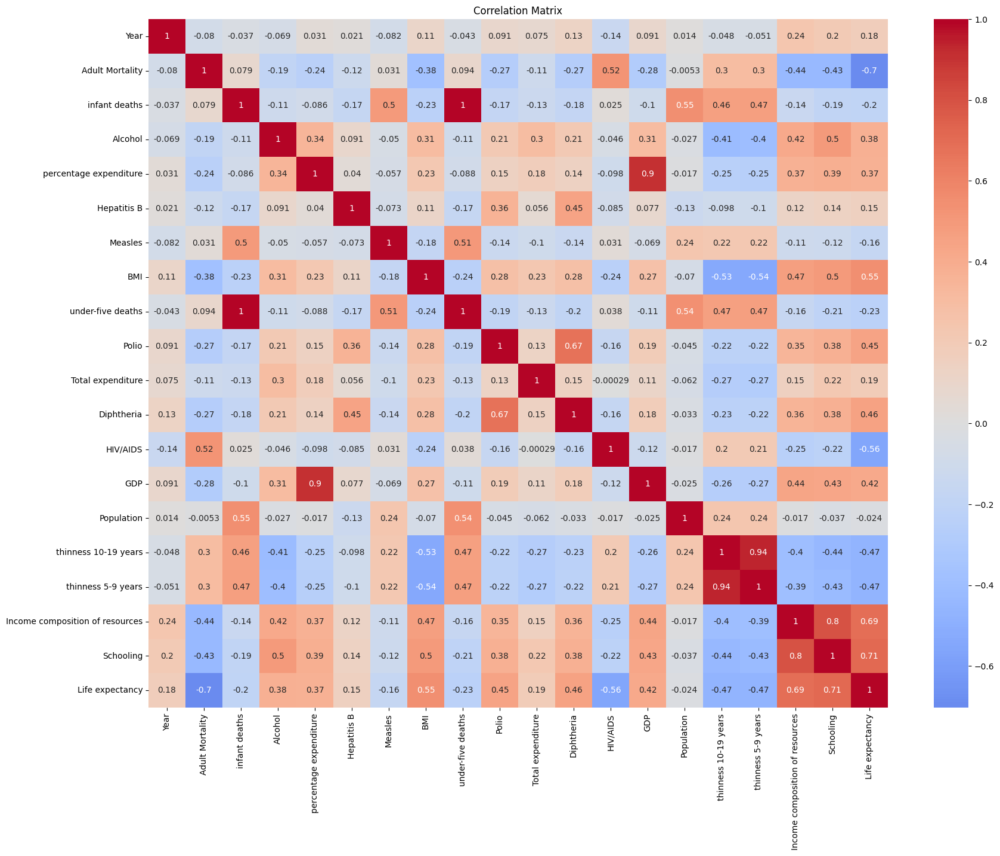

In [18]:
# Pairplot and correlation matrix
sns.pairplot(df[num_cols + ['Life expectancy']], hue='Life expectancy')
plt.suptitle('Pairplot of Numerical Variables by Life expectancy', y=1.02)
plt.show()

corr = df[num_cols + ['Life expectancy']].corr()
plt.figure(figsize=(20, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()


**Numerical vs. Categorical (Target = Life expectancy)**

<Figure size 1500x1000 with 0 Axes>

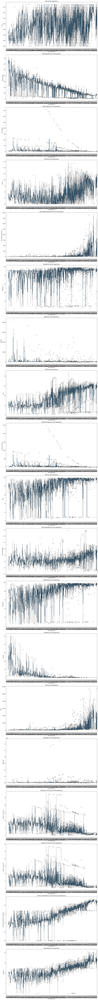

In [25]:
plt.figure(figsize=(15, 10)) # Mantener el ancho, ajustaremos la altura dinámicamente
n_vars = len(num_cols)
n_cols_per_row = 1 # Ahora solo una columna por fila
n_rows = n_vars # Una fila por cada variable

# Ajustar la altura de la figura para acomodar todas las filas.
# Puedes ajustar el multiplicador (por ejemplo, 8 o 10) para controlar la altura de cada gráfica.
plt.figure(figsize=(15, n_rows * 8))

for i, var in enumerate(num_cols):
    # Para una sola columna, el índice del subplot es simplemente i + 1
    subplot_index = i + 1

    plt.subplot(n_rows, n_cols_per_row, subplot_index)
    sns.boxplot(data=df, y=var, x='Life expectancy')
    plt.title(f'{var} by Life expectancy')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

**Categorical vs. Categorical**

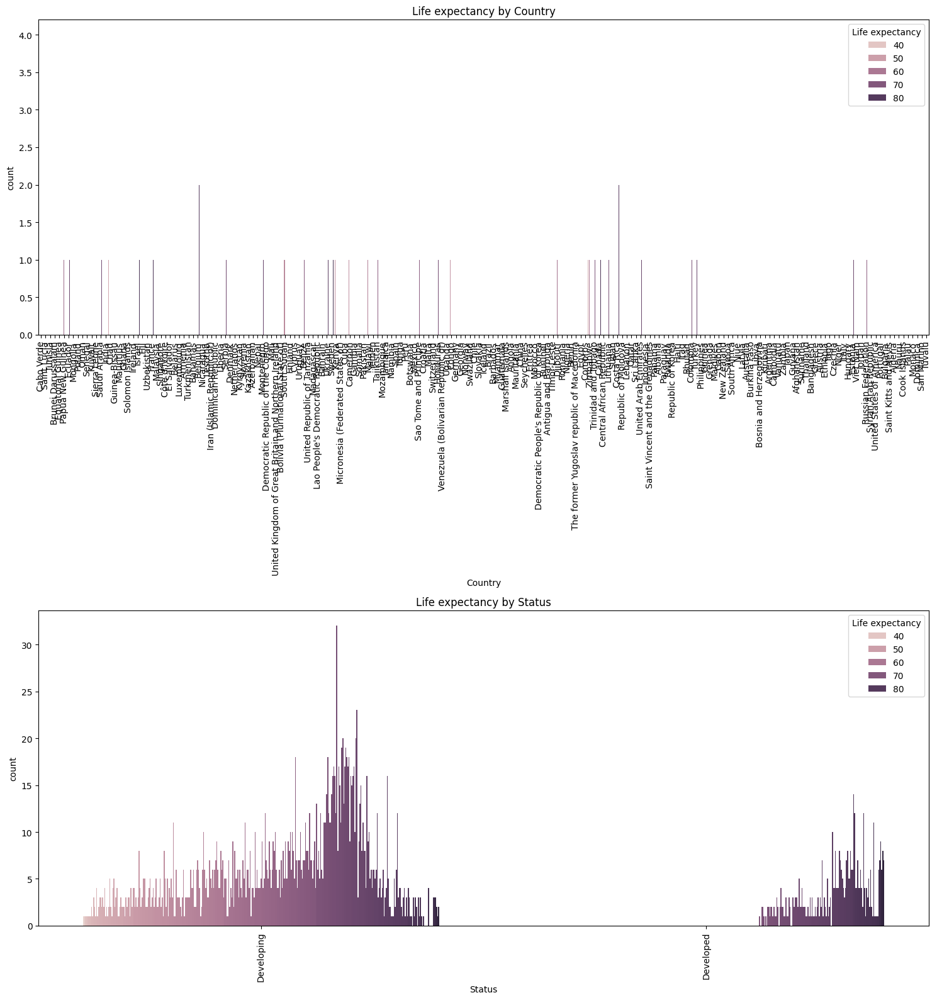

In [27]:
# Calculamos el número de variables categóricas
n_cat_vars = len(cat_cols)

# Definimos el número de columnas por fila
n_cols_per_row = 1

# El número de filas será igual al número de variables categóricas
n_rows = n_cat_vars

# Ajustamos el tamaño de la figura. Aumentamos la altura para acomodar todas las filas
# Puedes ajustar el multiplicador (por ejemplo, 8 o 10) según necesites para el tamaño de cada gráfica.
plt.figure(figsize=(15, n_rows * 8))

for i, var in enumerate(cat_cols):
    # Para una sola columna por fila, el índice del subplot es simplemente i + 1
    subplot_index = i + 1

    plt.subplot(n_rows, n_cols_per_row, subplot_index)
    sns.countplot(data=df, x=var, hue='Life expectancy')
    plt.title(f'Life expectancy by {var}')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

## Capping (winsorización)

In [28]:
def cap_outliers(df, lower_quantile=0.01, upper_quantile=0.99):
    capped_df = df.copy()
    for col in df.select_dtypes(include=np.number).columns:
        lower = df[col].quantile(lower_quantile)
        upper = df[col].quantile(upper_quantile)
        capped_df[col] = np.clip(df[col], lower, upper)
    return capped_df

df_capped = cap_outliers(df)

In [29]:
df_capped.describe()

,Id,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling,Life expectancy
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,...,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000,2350.000000
mean,1468.500000,2007.518720,164.147141,25.329884,4.533468,704.172946,83.035058,2008.055752,38.345231,35.877672,...,5.903351,82.410143,1.652396,6419.331695,8.062238e+06,4.775902,4.800953,0.630266,12.030259,69.293990
std,847.752772,4.613841,121.781876,68.078732,3.887282,1759.271578,22.952760,7434.980257,19.858584,98.948058,...,2.317144,23.599721,4.423303,12207.455461,2.156435e+07,4.198046,4.267497,0.204999,3.156940,9.484177
min,29.370000,2000.000000,4.370000,0.000000,0.010000,0.000000,6.000000,0.000000,2.300000,0.000000,...,1.257400,6.000000,0.100000,24.455693,8.138700e+02,0.200000,0.100000,0.000000,2.900000,45.549000
25%,734.250000,2004.000000,74.000000,0.000000,1.092500,4.685343,82.000000,0.000000,19.400000,0.000000,...,4.370000,78.000000,0.100000,580.486996,4.189172e+05,1.600000,1.600000,0.504250,10.300000,63.300000
50%,1468.500000,2008.000000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,...,5.755000,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000,72.200000
75%,2202.750000,2012.000000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,...,7.330000,97.000000,0.800000,4779.405190,4.584371e+06,7.100000,7.200000,0.772000,14.100000,75.700000
max,2907.630000,2015.000000,583.040000,495.040000,13.450000,10199.412527,99.000000,54163.360000,72.063000,767.820000,...,12.707100,99.000000,29.278000,62233.867014,1.469384e+08,19.500000,19.900000,0.923000,19.000000,87.000000


In [30]:
def count_outliers_iqr(df_capped):
    outlier_counts = {}
    for col in df_capped.select_dtypes(include=np.number).columns:
        Q1 = df_capped[col].quantile(0.25)
        Q3 = df_capped[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df_capped[(df_capped[col] < lower_bound) | (df_capped[col] > upper_bound)][col]
        outlier_counts[col] = len(outliers)
    return pd.Series(outlier_counts).sort_values(ascending=False)

outliers_iqr = count_outliers_iqr(df_capped)
print(outliers_iqr)

Measles                            542
HIV/AIDS                           542
Population                         452
GDP                                445
under-five deaths                  394
percentage expenditure             389
Hepatitis B                        322
infant deaths                      315
Diphtheria                         298
Polio                              279
Income composition of resources    130
thinness 10-19 years               100
thinness 5-9 years                  99
Adult Mortality                     86
Schooling                           64
Total expenditure                   51
Id                                   0
Alcohol                              0
Year                                 0
BMI                                  0
Life expectancy                      0
dtype: int64


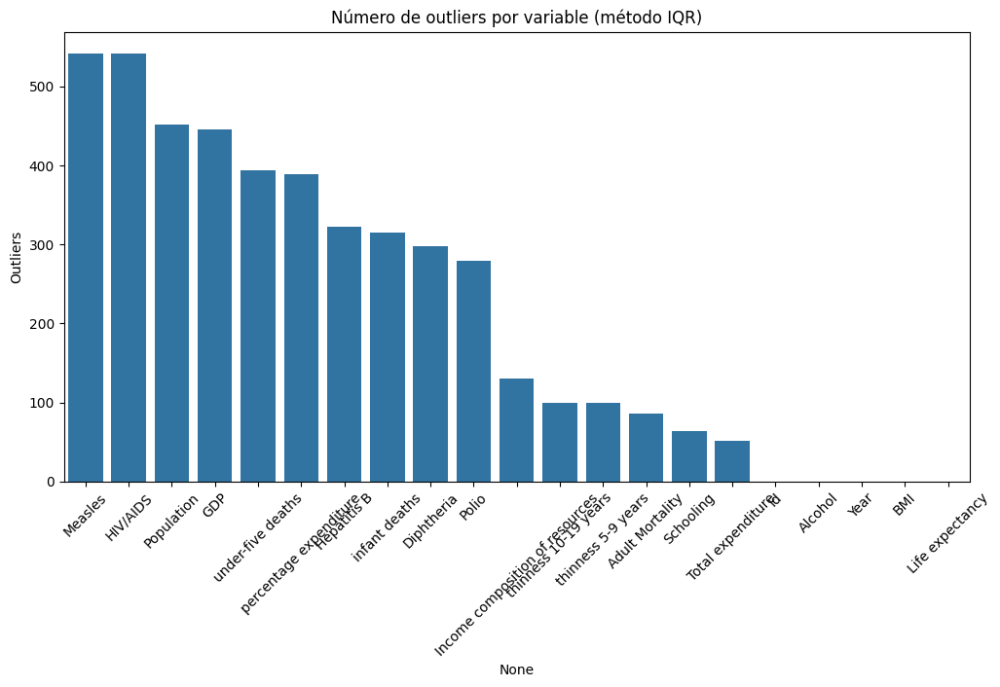

In [31]:
plt.figure(figsize=(12, 6))
sns.barplot(x=outliers_iqr.index, y=outliers_iqr.values)
plt.xticks(rotation=45)
plt.title("Número de outliers por variable (método IQR)")
plt.ylabel("Outliers")
plt.show()

## Categorical Encoding

In [33]:
for col in cat_cols:
    le = LabelEncoder()
    df_capped[col] = le.fit_transform(df_capped[col])

## Train - Test (Split)

In [34]:
train_clean = df_capped[df_capped["Life expectancy"].notnull()]
test_clean = df_capped[df_capped["Life expectancy"].isnull()].drop(columns=["Life expectancy"])


In [39]:
X = train_clean.drop(columns=["Life expectancy", "Id"])
y = train_clean["Life expectancy"]
X_test = test_clean.drop(columns=["Id"])

In [40]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_test_scaled = scaler.transform(X_test)

In [41]:
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


## Models to evaluate

In [42]:
models = {
    "LinearRegression": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=42),
    "GradientBoosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "SVR": SVR(),
    "XGBoost": XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}

## Evaluate each model

In [45]:
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_val)
    # Calculate MSE first
    mse = mean_squared_error(y_val, preds)
    # Calculate RMSE by taking the square root of MSE
    rmse = np.sqrt(mse)
    print(f"{name} RMSE: {rmse:.4f}")

LinearRegression RMSE: 3.7251
RandomForest RMSE: 1.7330
GradientBoosting RMSE: 2.1082
SVR RMSE: 3.4401
XGBoost RMSE: 1.6316


## Model training

In [48]:
final_model = models["RandomForest"]
final_model.fit(X_scaled, y)

# Predicción final sobre test
final_preds = final_model.predict(X_test_scaled)


## Submision

In [55]:
submission = pd.DataFrame({
    'ID': range(1, 589),
    'Life expectancy': final_preds
})

submission.to_csv("submission.csv", index=False)
print("✅ Archivo 'submission.csv' creado con éxito.")

✅ Archivo 'submission.csv' creado con éxito.


In [51]:
submission.shape

(588, 2)